In [25]:
from sklearn.datasets import make_classification
import numpy as np 
import matplotlib.pyplot as plt

In [26]:
X, y = make_classification(n_samples = 100,
                           n_features = 2,
                           n_informative = 1,
                           n_redundant = 0,
                           n_classes = 2, 
                           n_clusters_per_class = 1,
                           random_state = 41, 
                           hypercube = False,
                           class_sep=10)

In [27]:
np.insert(X,0,1,axis=1)

array([[ 1.        ,  0.19924745, -0.11697552],
       [ 1.        , -0.24882029, -0.73115232],
       [ 1.        , -0.3544904 , -0.7081059 ],
       [ 1.        , -1.59086506, -2.01199214],
       [ 1.        , -0.20083951,  1.63493163],
       [ 1.        , -0.83241122,  0.15599044],
       [ 1.        , -1.79207014,  1.07782053],
       [ 1.        ,  0.0856607 ,  0.80626713],
       [ 1.        , -0.55865299,  0.74859527],
       [ 1.        , -1.95974262,  0.75152794],
       [ 1.        , -1.77828947, -0.90114581],
       [ 1.        , -1.77985853, -0.1815243 ],
       [ 1.        , -0.02194151, -2.98092432],
       [ 1.        ,  0.80563431,  1.20500136],
       [ 1.        , -1.82701214,  0.78302407],
       [ 1.        ,  0.38730728,  0.42968688],
       [ 1.        , -0.14108668, -0.73229726],
       [ 1.        , -1.87955941, -0.83930476],
       [ 1.        , -0.18232911,  0.83727062],
       [ 1.        , -1.77059533, -0.10255323],
       [ 1.        , -2.27658028,  0.658

In [28]:
X.shape

(100, 2)

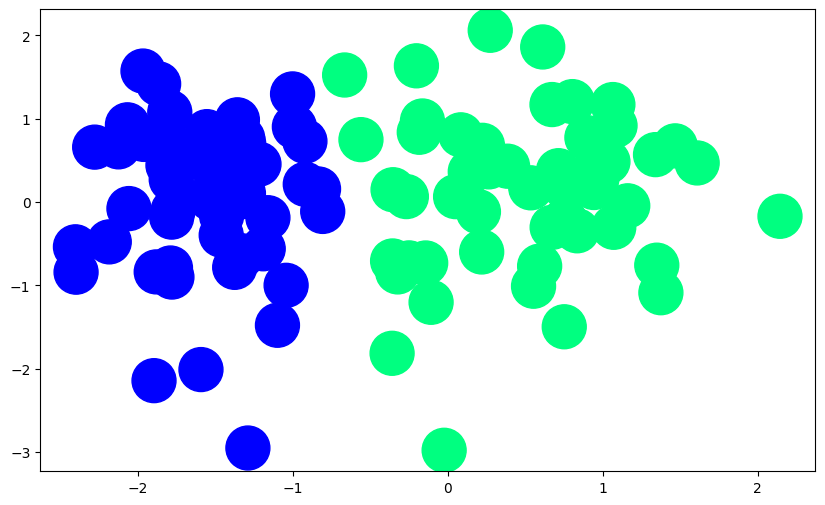

In [29]:
plt.figure(figsize=(10,6))
plt.scatter(X[:,0], X[:,1],c=y,cmap='winter',s=1000)

In [30]:
def perceptron(X,y):
    X = np.insert(X,0,1,axis=1)
    weights = np.ones(X.shape[1])
    lr = 0.1
    for i in range(1000):
        j = np.random.randint(0,100)
        y_hat = step(np.dot(X[j],weights))
        weights = weights + lr * (y[j] - y_hat) * X[j]

    return weights[0], weights[1:]

In [31]:
np.random.randint(0,100)

67

In [32]:
np.ones(3)

array([1., 1., 1.])

In [33]:
def step(z):
    return 1 if z >0 else 0

In [34]:
intercept_,coef_ = perceptron(X,y)

In [35]:
print(coef_)

[1.34714146 0.12894226]


In [36]:
print(intercept_)

0.9


In [37]:
m = -(coef_[0]/coef_[1])
b = -(intercept_/coef_[1])

In [38]:
x_input = np.linspace(-3,3,100)
y_input = m * x_input + b

(-3.0, 2.0)

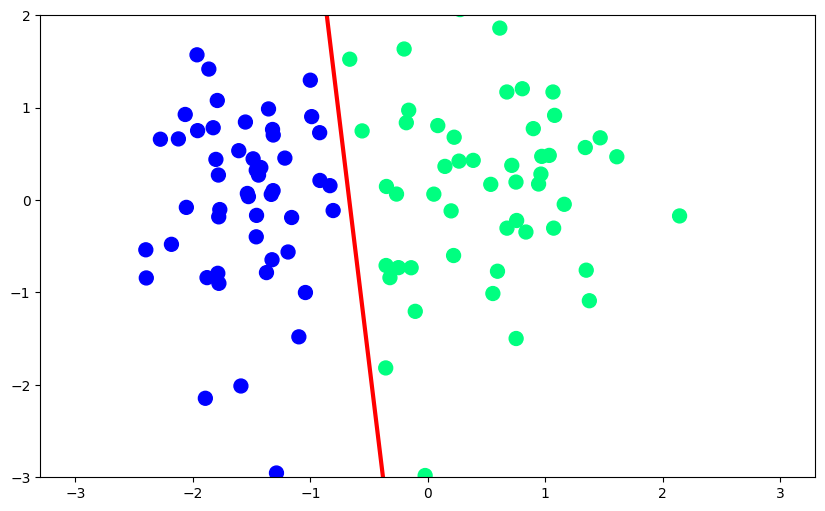

In [39]:
plt.figure(figsize=(10,6))
plt.plot(x_input, y_input, color='red', linewidth = 3)
plt.scatter(X[:,0], X[:,1],c=y,cmap='winter',s=100)
plt.ylim(-3,2)

In [40]:
def perceptron(X, y):

    m = []
    b = []

    X = np.insert(X, 0, 1, axis=1)
    weights = np.ones(X.shape[1])
    lr = 0.1

    for i in range(200):
        j = np.random.randint(0, 100)

        y_hat = step(np.dot(X[j], weights))

        weights = weights + lr * (y[j] - y_hat) * X[j]

        m.append(-(weights[1] / weights[2]))
        b.append(-(weights[0] / weights[2]))

    return m, b

In [41]:
m, b = perceptron(X, y)

In [42]:
%matplotlib notebook

from matplotlib.animation import FuncAnimation
import matplotlib.animation as animation

In [43]:
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import numpy as np
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(9, 5))

x_i = np.arange(-3, 3, 0.1)

ax.scatter(X[:, 0], X[:, 1], c=y, cmap='winter', s=100)

line, = ax.plot(
    x_i,
    x_i * m[0] + b[0],
    'r-',
    linewidth=2
)

plt.ylim(-3, 3)

def update(i):

    line.set_ydata(x_i * m[i] + b[i])
    ax.set_xlabel(f'Epoch {i+1}')

    return line,

anim = FuncAnimation(
    fig,
    update,
    frames=len(m),
    interval=100,
    repeat=True,
    blit=True
)

HTML(anim.to_jshtml())

<IPython.core.display.Javascript object>